In [ ]:
import os
print(os.listdir("/content"))


['.config', 'dataset', 'archive (3).zip', 'sample_data']


In [ ]:
import zipfile

zip_path = "/content/archive (3).zip" 
extract_path = "/content/dataset"  


with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Extraction completed!")


✅ Extraction completed!


In [ ]:

images_path = "/content/dataset/images"
image_files = os.listdir(images_path)
print(f"Total images found: {len(image_files)}")
print("First 10 images:", image_files[:10])


Total images found: 63565
First 10 images: ['45465_2014.jpg', '38724_2012.jpg', '31945_2010.jpg', '61380_2018.jpg', '22673_2008.jpg', '12431_2005.jpg', '10542_2005.jpg', '25897_2009.jpg', '21970_2008.jpg', '9645_2004.jpg']


In [21]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image


In [22]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda


In [23]:
# Step 3: Transformations
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5 for _ in range(3)], [0.5 for _ in range(3)])  # Normalize to [-1, 1]
])


In [ ]:
# Step 4: Dataset (only 1000 images)
import random
full_dataset = ImageFolder(root="/content/dataset", transform=transform)
subset_indices = random.sample(range(len(full_dataset)), 1000)
subset_dataset = torch.utils.data.Subset(full_dataset, subset_indices)


In [26]:
# Step 5: DataLoader
dataloader = DataLoader(subset_dataset, batch_size=128, shuffle=True, num_workers=2)


In [27]:
print(f"Total images used for training: {len(subset_dataset)}")


Total images used for training: 1000


In [33]:
# Step 6: Generator (DCGAN Style)
class Generator(nn.Module):
    def __init__(self, z_dim=100):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 512, 4, 1, 0, bias=False),   # (512, 4, 4)
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),     # (256, 8, 8)
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),     # (128, 16, 16)
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),      # (64, 32, 32)
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),        # (3, 64, 64)
            nn.Tanh()
        )

    def forward(self, input):
        return self.model(input)

# Initialize Generator
z_dim = 100  # latent vector size
gen = Generator(z_dim).to(device)


In [34]:
# Step 7: Discriminator (DCGAN Style)
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),   # (64, 32, 32)
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False), # (128, 16, 16)
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),# (256, 8, 8)
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),# (512, 4, 4)
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Flatten(),
            nn.Linear(512*4*4, 1),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.model(input)

# Initialize Discriminator
disc = Discriminator().to(device)


In [35]:
# Step 8: Loss Function and Optimizers

# Loss
criterion = nn.BCELoss()

# Optimizers
lr = 0.0002  # learning rate
beta1 = 0.5  # beta1 for Adam optimizer (DCGAN paper recommends)

optimizer_gen = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_disc = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta1, 0.999))


In [36]:
# Step 9: Training Preparation

# Training parameters
num_epochs = 500
fixed_noise = torch.randn(64, z_dim, 1, 1, device=device)  # For consistent image generation

# Lists to store history
loss_gen_history = []
loss_disc_history = []

# Labels
real_label = 1.
fake_label = 0.


In [37]:
import time
import torch

# Hyperparameters
lr = 0.0002
z_dim = 100
num_epochs = 500

# Optimizers
opt_gen = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
opt_disc = torch.optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))

# Loss
criterion = nn.BCELoss()

# Fixed noise for visualization
fixed_noise = torch.randn(64, z_dim, 1, 1).to(device)

# Loss histories
loss_gen_history = []
loss_disc_history = []

# Labels
real_label = 1.
fake_label = 0.

print("Starting Training...")

for epoch in range(1, num_epochs+1):
    epoch_start = time.time()

    for batch_idx, (real, _) in enumerate(dataloader):
        real = real.to(device)
        batch_size = real.size(0)

        ### Train Discriminator ###
        noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
        fake = gen(noise)

        disc_real = disc(real).view(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))

        disc_fake = disc(fake.detach()).view(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

        loss_disc = (loss_disc_real + loss_disc_fake) / 2

        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator ###
        output = disc(fake).view(-1)
        loss_gen = criterion(output, torch.ones_like(output))

        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

    # After one full epoch
    loss_gen_history.append(loss_gen.item())
    loss_disc_history.append(loss_disc.item())

    epoch_duration = time.time() - epoch_start

    # ✅ Print only every 50 epochs
    if epoch % 50 == 0 or epoch == 1:
        print(f"Epoch [{epoch}/{num_epochs}] | Loss D: {loss_disc_history[-1]:.4f} | Loss G: {loss_gen_history[-1]:.4f} | Time: {epoch_duration:.2f}s")

    # ✅ Save generated images every 50 epochs
    if epoch % 50 == 0:
        with torch.no_grad():
            fake = gen(fixed_noise).detach().cpu()
        grid = make_grid(fake, normalize=True)
        npimg = grid.numpy()
        plt.figure(figsize=(8,8))
        plt.imshow(np.transpose(npimg, (1,2,0)))
        plt.axis('off')
        plt.title(f"Generated Images at Epoch {epoch}")
        plt.savefig(f"/content/generated_epoch_{epoch}.png")
        plt.close()

print("Training Complete!")


Starting Training...
Epoch [1/500] | Loss D: 0.0606 | Loss G: 5.6321 | Time: 2.95s
Epoch [50/500] | Loss D: 0.2287 | Loss G: 5.6419 | Time: 1.44s
Epoch [100/500] | Loss D: 0.2309 | Loss G: 5.6243 | Time: 1.43s
Epoch [150/500] | Loss D: 0.1393 | Loss G: 4.9120 | Time: 1.48s
Epoch [200/500] | Loss D: 0.0985 | Loss G: 6.6125 | Time: 1.49s
Epoch [250/500] | Loss D: 0.0748 | Loss G: 7.6952 | Time: 1.48s
Epoch [300/500] | Loss D: 0.2122 | Loss G: 12.1292 | Time: 1.46s
Epoch [350/500] | Loss D: 0.0649 | Loss G: 6.0975 | Time: 1.44s
Epoch [400/500] | Loss D: 0.0299 | Loss G: 13.4219 | Time: 1.45s
Epoch [450/500] | Loss D: 0.0421 | Loss G: 6.8521 | Time: 1.48s
Epoch [500/500] | Loss D: 0.0700 | Loss G: 7.6836 | Time: 1.46s
Training Complete!


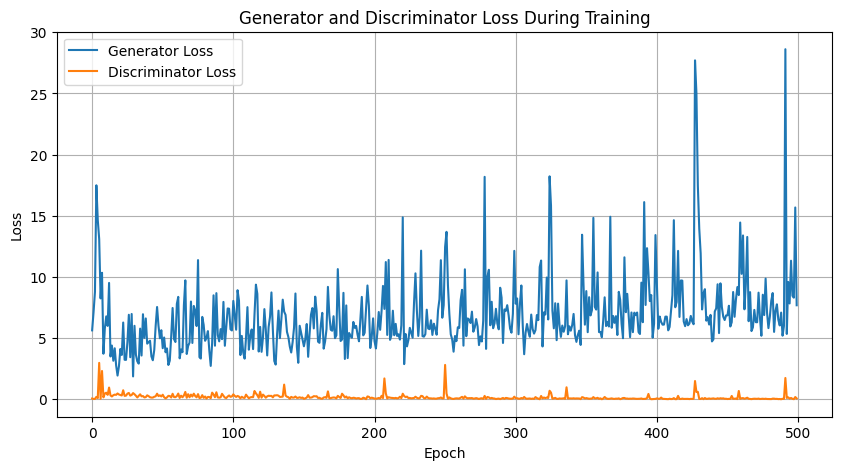

In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(loss_gen_history, label="Generator Loss")
plt.plot(loss_disc_history, label="Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Generator and Discriminator Loss During Training")
plt.legend()
plt.grid(True)
plt.show()


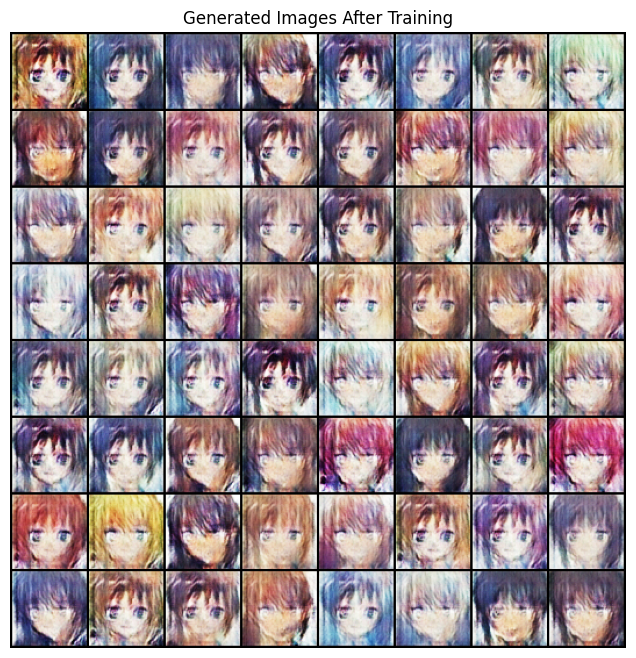

In [39]:
# Generate new random noise
new_noise = torch.randn(64, z_dim, 1, 1).to(device)

# Pass through the trained generator
fake_images = gen(new_noise)

# Denormalize images from [-1, 1] → [0, 1] for display
fake_images = (fake_images + 1) / 2

# Plot
grid = make_grid(fake_images, nrow=8)
plt.figure(figsize=(8,8))
plt.imshow(grid.permute(1, 2, 0).cpu().detach().numpy())
plt.axis("off")
plt.title("Generated Images After Training")
plt.show()


In [40]:
torch.save(gen.state_dict(), "generator.pth")


Epoch 501 completed in 1.56 seconds.
Epoch 502 completed in 1.48 seconds.
Epoch 503 completed in 1.51 seconds.
Epoch 504 completed in 1.52 seconds.
Epoch 505 completed in 1.54 seconds.
Epoch 506 completed in 1.55 seconds.
Epoch 507 completed in 1.73 seconds.
Epoch 508 completed in 1.85 seconds.
Epoch 509 completed in 2.32 seconds.
Epoch 510 completed in 1.79 seconds.
Epoch 511 completed in 1.60 seconds.
Epoch 512 completed in 1.57 seconds.
Epoch 513 completed in 1.55 seconds.
Epoch 514 completed in 1.78 seconds.
Epoch 515 completed in 1.52 seconds.
Epoch 516 completed in 1.53 seconds.
Epoch 517 completed in 1.52 seconds.
Epoch 518 completed in 1.52 seconds.
Epoch 519 completed in 1.51 seconds.
Epoch 520 completed in 1.51 seconds.
Epoch 521 completed in 1.48 seconds.
Epoch 522 completed in 1.66 seconds.
Epoch 523 completed in 1.48 seconds.
Epoch 524 completed in 1.45 seconds.
Epoch 525 completed in 1.46 seconds.
Epoch 526 completed in 1.46 seconds.
Epoch 527 completed in 1.48 seconds.
E

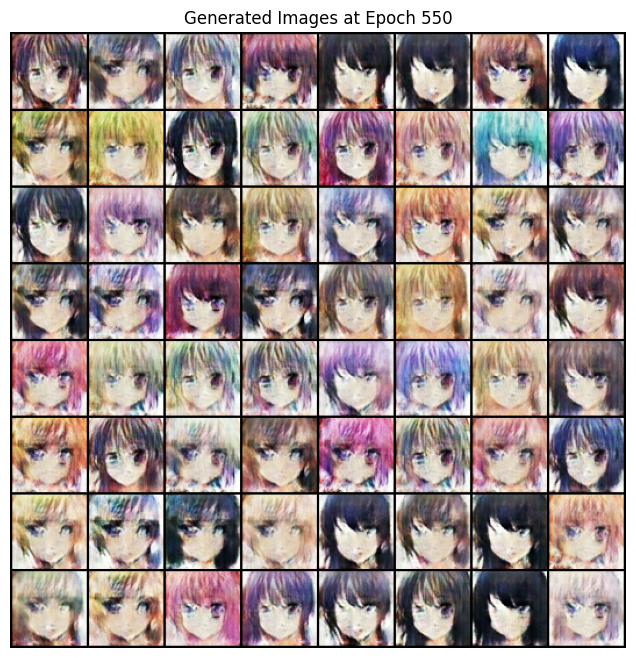

Epoch 550 completed in 1.91 seconds.
Epoch 551 completed in 1.47 seconds.
Epoch 552 completed in 1.44 seconds.
Epoch 553 completed in 1.45 seconds.
Epoch 554 completed in 1.47 seconds.
Epoch 555 completed in 1.70 seconds.
Epoch 556 completed in 1.48 seconds.
Epoch 557 completed in 1.48 seconds.
Epoch 558 completed in 1.46 seconds.
Epoch 559 completed in 1.48 seconds.
Epoch 560 completed in 1.48 seconds.
Epoch 561 completed in 1.48 seconds.
Epoch 562 completed in 1.48 seconds.
Epoch 563 completed in 1.63 seconds.
Epoch 564 completed in 1.67 seconds.
Epoch 565 completed in 1.50 seconds.
Epoch 566 completed in 1.51 seconds.
Epoch 567 completed in 1.50 seconds.
Epoch 568 completed in 1.51 seconds.
Epoch 569 completed in 1.52 seconds.
Epoch 570 completed in 1.53 seconds.
Epoch 571 completed in 1.65 seconds.
Epoch 572 completed in 1.62 seconds.
Epoch 573 completed in 1.49 seconds.
Epoch 574 completed in 1.51 seconds.
Epoch 575 completed in 1.49 seconds.
Epoch 576 completed in 1.50 seconds.
E

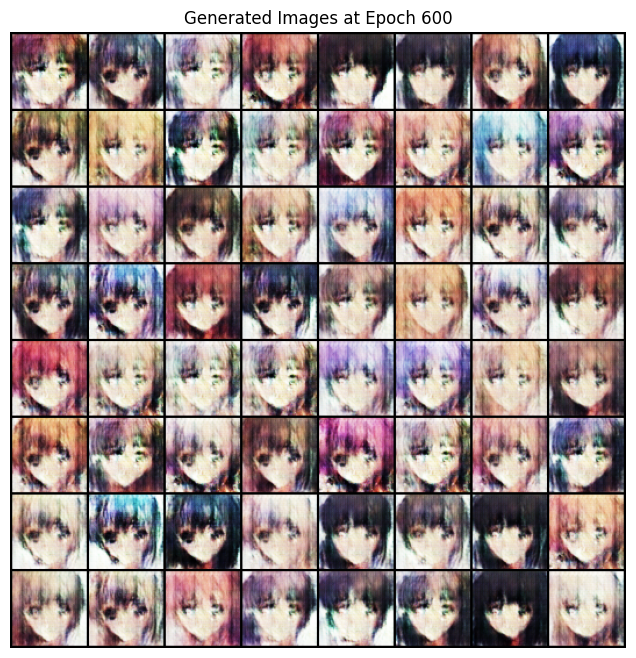

Epoch 600 completed in 1.93 seconds.
Epoch 601 completed in 1.47 seconds.
Epoch 602 completed in 1.47 seconds.
Epoch 603 completed in 1.45 seconds.
Epoch 604 completed in 1.56 seconds.
Epoch 605 completed in 1.53 seconds.
Epoch 606 completed in 1.47 seconds.
Epoch 607 completed in 1.47 seconds.
Epoch 608 completed in 1.49 seconds.
Epoch 609 completed in 1.49 seconds.
Epoch 610 completed in 1.48 seconds.
Epoch 611 completed in 1.49 seconds.
Epoch 612 completed in 1.67 seconds.
Epoch 613 completed in 1.56 seconds.
Epoch 614 completed in 1.48 seconds.
Epoch 615 completed in 1.48 seconds.
Epoch 616 completed in 1.48 seconds.
Epoch 617 completed in 1.49 seconds.
Epoch 618 completed in 1.50 seconds.
Epoch 619 completed in 1.48 seconds.
Epoch 620 completed in 1.59 seconds.
Epoch 621 completed in 1.65 seconds.
Epoch 622 completed in 1.47 seconds.
Epoch 623 completed in 1.49 seconds.
Epoch 624 completed in 1.50 seconds.
Epoch 625 completed in 1.50 seconds.
Epoch 626 completed in 1.48 seconds.
E

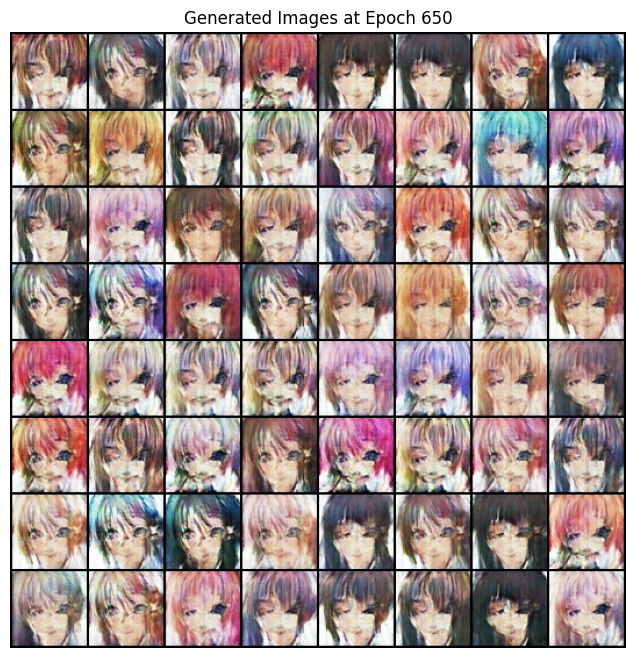

Epoch 650 completed in 1.95 seconds.
Epoch 651 completed in 1.51 seconds.
Epoch 652 completed in 1.50 seconds.
Epoch 653 completed in 1.67 seconds.
Epoch 654 completed in 1.54 seconds.
Epoch 655 completed in 1.48 seconds.
Epoch 656 completed in 1.49 seconds.
Epoch 657 completed in 1.48 seconds.
Epoch 658 completed in 1.47 seconds.
Epoch 659 completed in 1.50 seconds.
Epoch 660 completed in 1.48 seconds.
Epoch 661 completed in 1.75 seconds.
Epoch 662 completed in 1.57 seconds.
Epoch 663 completed in 1.49 seconds.
Epoch 664 completed in 1.50 seconds.
Epoch 665 completed in 1.52 seconds.
Epoch 666 completed in 1.49 seconds.
Epoch 667 completed in 1.50 seconds.
Epoch 668 completed in 1.51 seconds.
Epoch 669 completed in 1.64 seconds.
Epoch 670 completed in 1.59 seconds.
Epoch 671 completed in 1.48 seconds.
Epoch 672 completed in 1.49 seconds.
Epoch 673 completed in 1.50 seconds.
Epoch 674 completed in 1.49 seconds.
Epoch 675 completed in 1.51 seconds.
Epoch 676 completed in 1.48 seconds.
E

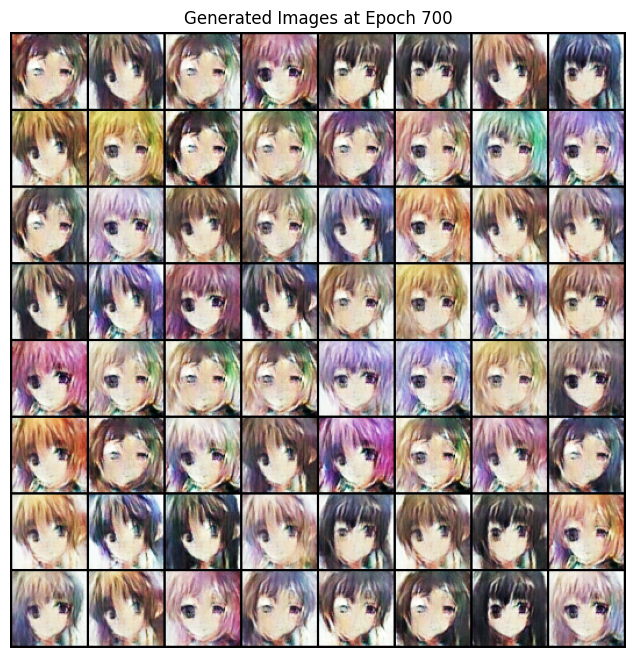

Epoch 700 completed in 1.99 seconds.
Epoch 701 completed in 1.53 seconds.
Epoch 702 completed in 1.71 seconds.
Epoch 703 completed in 1.58 seconds.
Epoch 704 completed in 1.50 seconds.
Epoch 705 completed in 1.50 seconds.
Epoch 706 completed in 1.50 seconds.
Epoch 707 completed in 1.49 seconds.
Epoch 708 completed in 1.48 seconds.
Epoch 709 completed in 1.50 seconds.
Epoch 710 completed in 1.70 seconds.
Epoch 711 completed in 1.57 seconds.
Epoch 712 completed in 1.51 seconds.
Epoch 713 completed in 1.51 seconds.
Epoch 714 completed in 1.48 seconds.
Epoch 715 completed in 1.51 seconds.
Epoch 716 completed in 1.50 seconds.
Epoch 717 completed in 1.48 seconds.
Epoch 718 completed in 1.74 seconds.
Epoch 719 completed in 1.61 seconds.
Epoch 720 completed in 1.49 seconds.
Epoch 721 completed in 1.51 seconds.
Epoch 722 completed in 1.50 seconds.
Epoch 723 completed in 1.51 seconds.
Epoch 724 completed in 1.51 seconds.
Epoch 725 completed in 1.51 seconds.
Epoch 726 completed in 1.76 seconds.
E

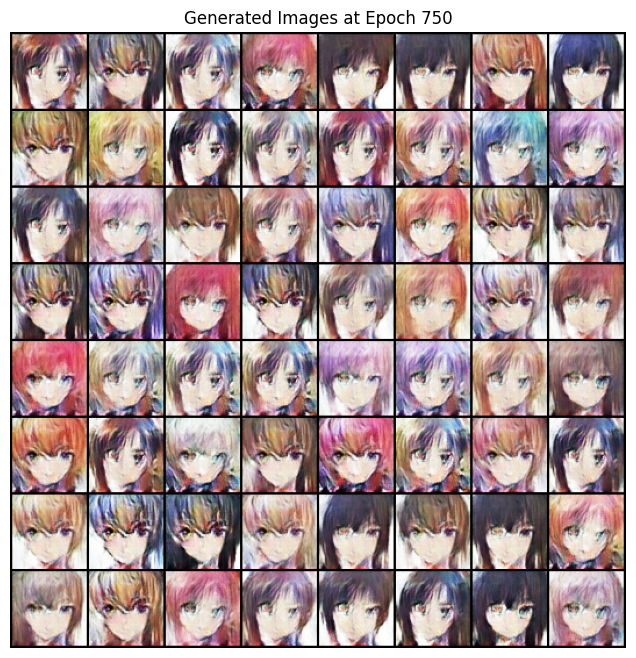

Epoch 750 completed in 2.14 seconds.
Epoch 751 completed in 1.69 seconds.
Epoch 752 completed in 1.53 seconds.
Epoch 753 completed in 1.56 seconds.
Epoch 754 completed in 1.52 seconds.
Epoch 755 completed in 1.52 seconds.
Epoch 756 completed in 1.52 seconds.
Epoch 757 completed in 1.50 seconds.
Epoch 758 completed in 1.62 seconds.
Epoch 759 completed in 1.57 seconds.
Epoch 760 completed in 1.53 seconds.
Epoch 761 completed in 1.52 seconds.
Epoch 762 completed in 1.56 seconds.
Epoch 763 completed in 1.51 seconds.
Epoch 764 completed in 1.50 seconds.
Epoch 765 completed in 1.53 seconds.
Epoch 766 completed in 1.52 seconds.
Epoch 767 completed in 1.60 seconds.
Epoch 768 completed in 1.55 seconds.
Epoch 769 completed in 1.51 seconds.
Epoch 770 completed in 1.50 seconds.
Epoch 771 completed in 1.50 seconds.
Epoch 772 completed in 1.50 seconds.
Epoch 773 completed in 1.51 seconds.
Epoch 774 completed in 1.52 seconds.
Epoch 775 completed in 1.74 seconds.
Epoch 776 completed in 1.62 seconds.
E

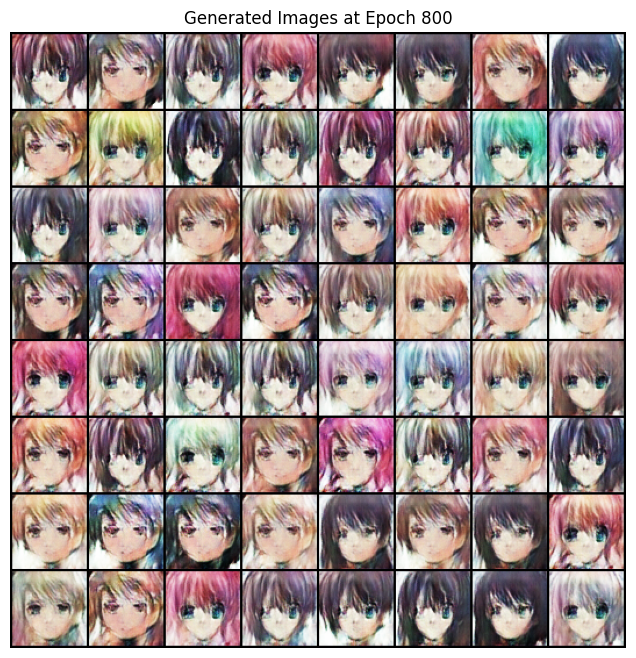

Epoch 800 completed in 2.20 seconds.
Epoch 801 completed in 1.60 seconds.
Epoch 802 completed in 1.54 seconds.
Epoch 803 completed in 1.54 seconds.
Epoch 804 completed in 1.50 seconds.
Epoch 805 completed in 1.54 seconds.
Epoch 806 completed in 1.50 seconds.
Epoch 807 completed in 1.63 seconds.
Epoch 808 completed in 1.65 seconds.
Epoch 809 completed in 1.53 seconds.
Epoch 810 completed in 1.48 seconds.
Epoch 811 completed in 1.54 seconds.
Epoch 812 completed in 1.51 seconds.
Epoch 813 completed in 1.50 seconds.
Epoch 814 completed in 1.53 seconds.
Epoch 815 completed in 1.55 seconds.
Epoch 816 completed in 1.69 seconds.
Epoch 817 completed in 1.54 seconds.
Epoch 818 completed in 1.50 seconds.
Epoch 819 completed in 1.55 seconds.
Epoch 820 completed in 1.53 seconds.
Epoch 821 completed in 1.54 seconds.
Epoch 822 completed in 1.52 seconds.
Epoch 823 completed in 1.52 seconds.
Epoch 824 completed in 1.73 seconds.
Epoch 825 completed in 1.57 seconds.
Epoch 826 completed in 1.55 seconds.
E

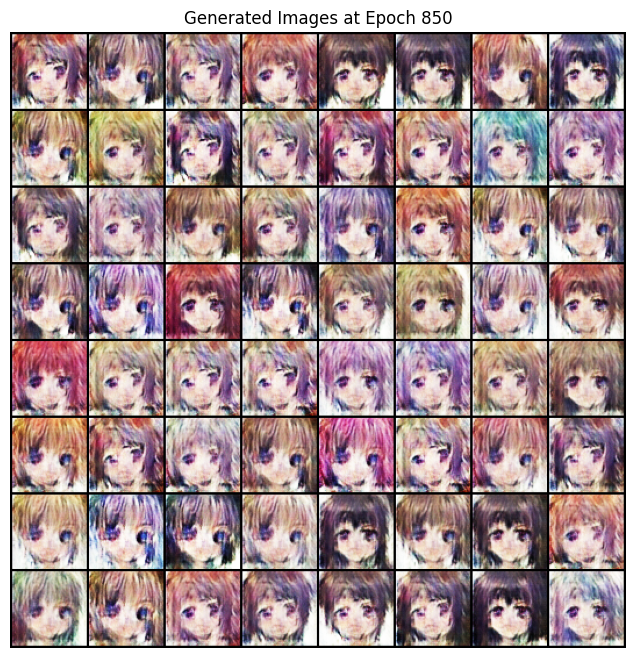

Epoch 850 completed in 2.03 seconds.
Epoch 851 completed in 1.57 seconds.
Epoch 852 completed in 1.50 seconds.
Epoch 853 completed in 1.51 seconds.
Epoch 854 completed in 1.58 seconds.
Epoch 855 completed in 1.54 seconds.
Epoch 856 completed in 1.70 seconds.
Epoch 857 completed in 1.50 seconds.
Epoch 858 completed in 1.52 seconds.
Epoch 859 completed in 1.50 seconds.
Epoch 860 completed in 1.54 seconds.
Epoch 861 completed in 1.51 seconds.
Epoch 862 completed in 1.48 seconds.
Epoch 863 completed in 1.51 seconds.
Epoch 864 completed in 1.77 seconds.
Epoch 865 completed in 1.58 seconds.
Epoch 866 completed in 1.57 seconds.
Epoch 867 completed in 1.54 seconds.
Epoch 868 completed in 1.54 seconds.
Epoch 869 completed in 1.54 seconds.
Epoch 870 completed in 1.52 seconds.
Epoch 871 completed in 1.55 seconds.
Epoch 872 completed in 1.71 seconds.
Epoch 873 completed in 1.55 seconds.
Epoch 874 completed in 1.57 seconds.
Epoch 875 completed in 1.53 seconds.
Epoch 876 completed in 1.52 seconds.
E

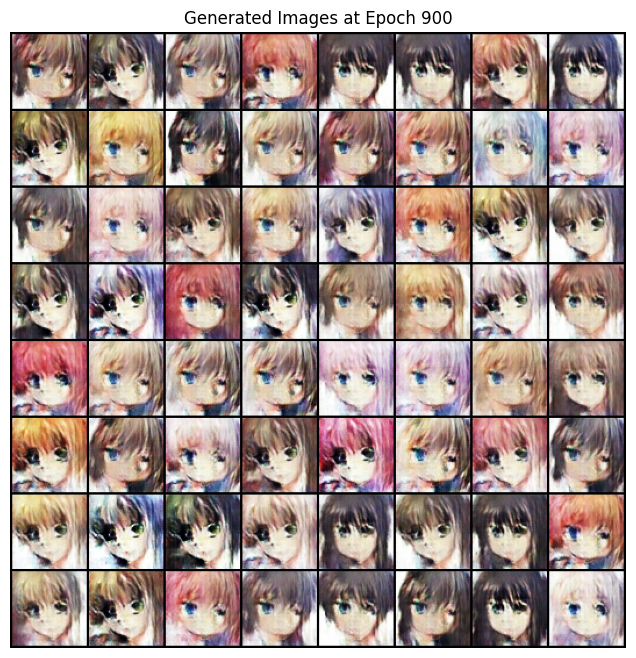

Epoch 900 completed in 2.01 seconds.
Epoch 901 completed in 1.57 seconds.
Epoch 902 completed in 1.50 seconds.
Epoch 903 completed in 1.52 seconds.
Epoch 904 completed in 1.61 seconds.
Epoch 905 completed in 1.51 seconds.
Epoch 906 completed in 1.56 seconds.
Epoch 907 completed in 1.56 seconds.
Epoch 908 completed in 1.50 seconds.
Epoch 909 completed in 1.52 seconds.
Epoch 910 completed in 1.57 seconds.
Epoch 911 completed in 1.54 seconds.
Epoch 912 completed in 1.63 seconds.
Epoch 913 completed in 1.58 seconds.
Epoch 914 completed in 1.53 seconds.
Epoch 915 completed in 1.50 seconds.
Epoch 916 completed in 1.53 seconds.
Epoch 917 completed in 1.60 seconds.
Epoch 918 completed in 1.56 seconds.
Epoch 919 completed in 1.56 seconds.
Epoch 920 completed in 1.71 seconds.
Epoch 921 completed in 1.50 seconds.
Epoch 922 completed in 1.54 seconds.
Epoch 923 completed in 1.50 seconds.
Epoch 924 completed in 1.50 seconds.
Epoch 925 completed in 1.50 seconds.
Epoch 926 completed in 1.49 seconds.
E

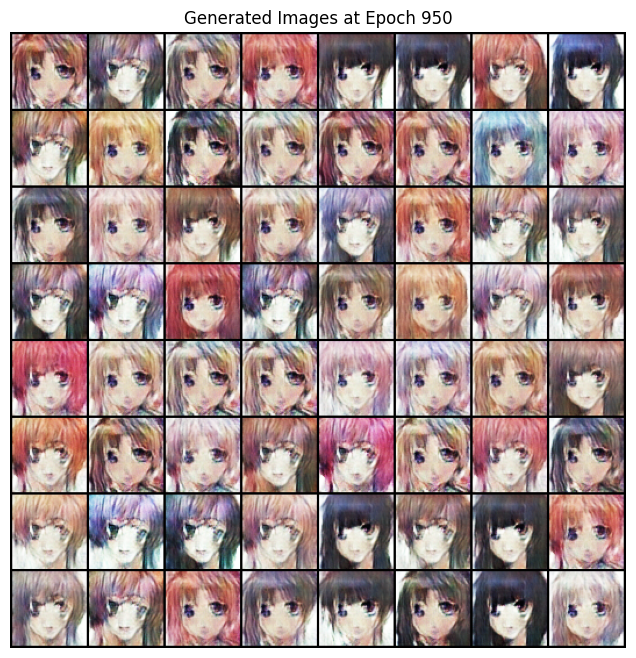

Epoch 950 completed in 2.08 seconds.
Epoch 951 completed in 1.60 seconds.
Epoch 952 completed in 1.66 seconds.
Epoch 953 completed in 1.52 seconds.
Epoch 954 completed in 1.57 seconds.
Epoch 955 completed in 1.52 seconds.
Epoch 956 completed in 1.60 seconds.
Epoch 957 completed in 1.56 seconds.
Epoch 958 completed in 1.52 seconds.
Epoch 959 completed in 1.54 seconds.
Epoch 960 completed in 1.77 seconds.
Epoch 961 completed in 1.56 seconds.
Epoch 962 completed in 1.57 seconds.
Epoch 963 completed in 1.50 seconds.
Epoch 964 completed in 1.58 seconds.
Epoch 965 completed in 1.49 seconds.
Epoch 966 completed in 1.56 seconds.
Epoch 967 completed in 1.53 seconds.
Epoch 968 completed in 1.63 seconds.
Epoch 969 completed in 1.56 seconds.
Epoch 970 completed in 1.54 seconds.
Epoch 971 completed in 1.57 seconds.
Epoch 972 completed in 1.50 seconds.
Epoch 973 completed in 1.54 seconds.
Epoch 974 completed in 1.59 seconds.
Epoch 975 completed in 1.60 seconds.
Epoch 976 completed in 1.72 seconds.
E

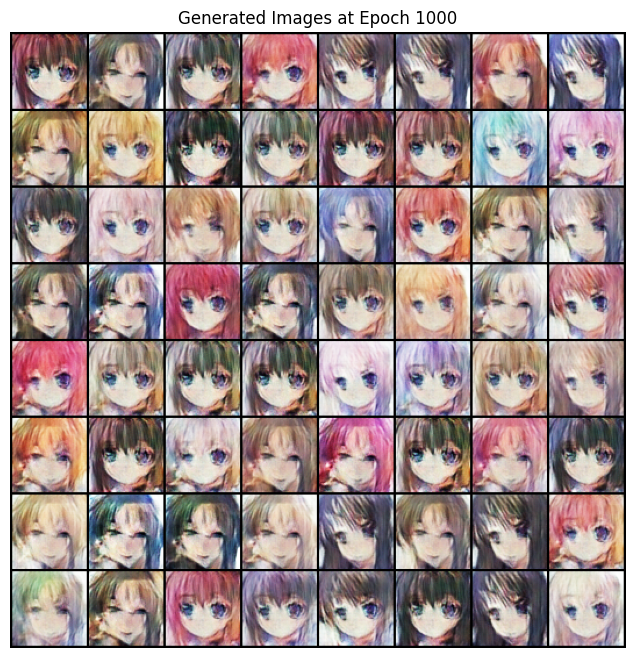

Epoch 1000 completed in 2.23 seconds.


In [ ]:
import time

gen_losses = []
disc_losses = []

# Continue Training from Epoch 501 to 1000
start_epoch = 501
end_epoch = 1000

for epoch in range(start_epoch, end_epoch + 1):
    start_time = time.time()

    for real, _ in dataloader:
        real = real.to(device)
        batch_size = real.size(0)

        ### Train Discriminator
        noise = torch.randn(batch_size, z_dim, 1, 1, device=device)
        fake = gen(noise)

        disc_real = disc(real).view(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))

        disc_fake = disc(fake.detach()).view(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

        loss_disc = (loss_disc_real + loss_disc_fake) / 2

        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator
        output = disc(fake).view(-1)
        loss_gen = criterion(output, torch.ones_like(output))

        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

    # Add to loss history
    gen_losses.append(loss_gen.item())
    disc_losses.append(loss_disc.item())

    # Print & Save images every 50 epochs
    if epoch % 50 == 0:
        print(f"Epoch [{epoch}/{end_epoch}]  Loss D: {loss_disc.item():.4f}, Loss G: {loss_gen.item():.4f}")

        with torch.no_grad():
            fake = gen(fixed_noise).detach().cpu()
        grid = make_grid(fake, nrow=8, normalize=True)

        # Show image in terminal
        plt.figure(figsize=(8,8))
        plt.imshow(np.transpose(grid, (1,2,0)))
        plt.title(f"Generated Images at Epoch {epoch}")
        plt.axis('off')
        plt.show()

        # Save image
        plt.imsave(f"/content/generated_epoch_{epoch}.png", np.transpose(grid, (1,2,0)))

    # Time per epoch
    end_time = time.time()
    epoch_time = end_time - start_time
    print(f"Epoch {epoch} completed in {epoch_time:.2f} seconds.")


In [43]:
# Save Generator and Discriminator models
torch.save(gen.state_dict(), '/content/generator.pth')
torch.save(disc.state_dict(), '/content/discriminator.pth')

print("✅ Models saved successfully!")


✅ Models saved successfully!


In [46]:
gen_losses_old = loss_gen_history  # from epochs 1-500
disc_losses_old = loss_disc_history  # from epochs 1-500


In [47]:
gen_losses_total = gen_losses_old + gen_losses   # gen_losses from 501-1000
disc_losses_total = disc_losses_old + disc_losses


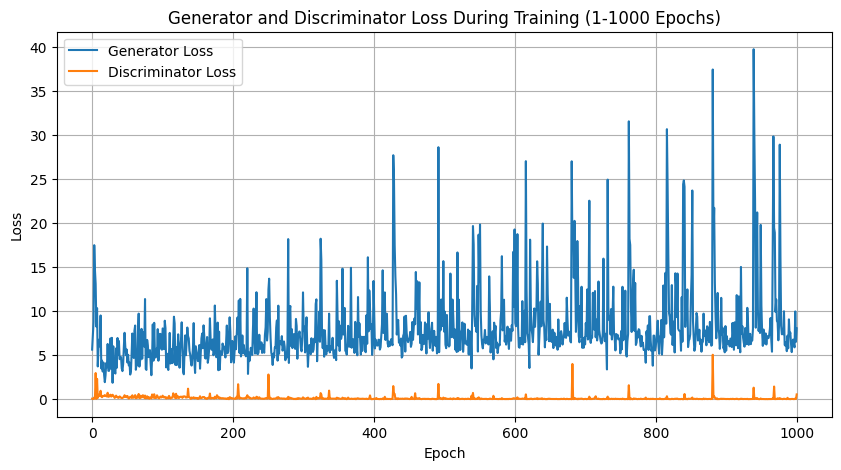

In [ ]:

gen_losses_total = gen_losses_old + gen_losses   
disc_losses_total = disc_losses_old + disc_losses

# Step 3: Now plot
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(gen_losses_total, label="Generator Loss")
plt.plot(disc_losses_total, label="Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Generator and Discriminator Loss During Training (1-1000 Epochs)")
plt.legend()
plt.grid(True)
plt.show()
